<div class="usecase-title">Ideal Green Wall Locations: Melbourne</div>

<div class="usecase-authors"><b>Authored by: </b> Ryan Waites, Julian Cape</div>

<div class="usecase-duration"><b>Duration:</b> 120 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>Beginner</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>Python</div>
</div>

<div class="usecase-section-header">Scenario</div>

**1. As a city planner, I want to determine the best potential locations for new green walls in the city of Melbourne. What locations would be most beneficial?**

Green walls have been proven to have a moderating effect on multiple environmental factors. In addition to this they provide wildlife corridors and visual amenity. I would like to visualise a range of relevant factors such as pollution, temperatures and tree coverage in order to determine the most impactful locations for the installation of new green walls around Melbourne.

<div class="usecase-section-header">What this use case will teach you</div>

At the end of this use case you will:
- understand how to access and collect data from Melbourne Open Data
- have explored a variety of datasets relevant to the location of green walls. These include environmental, tree canopy coverage and pedestrian sensor data.
- have combined and visualised multiple datasets over a map of the city.
- have viewed the identified walls through Google Street view. 

<div class="usecase-section-header">A brief introduction to the issue and datasets used</div>

**Issue being addressed**

It is a priority of the City of Melbourne to create a healthier natural environment and adapt the city to climate change. These goals are outlined in the council's [visions and goals](https://www.melbourne.vic.gov.au/about-council/vision-goals/Pages/climate-biodiversity-emergency.aspx). 

One component of their plan to tackle these issues is Melbourne's [Urban Forest Strategy](https://www.melbourne.vic.gov.au/SiteCollectionDocuments/urban-forest-strategy.pdf). The strategy aims to improve the overall ecological health of the city by addressing canopy cover, plant diversity, vegetation health and ecology.


Green walls are vertically built structures intentionally covered by vegetation. They provide an extra option to assist in meeting several of these goals, enabling greening of areas with little available space. Several considerations, requirements and benefits associated with green walls can be explored further in the city's [growing green guide](https://www.melbourne.vic.gov.au/SiteCollectionDocuments/growing-green-guide.pdf). The datasets explored in this analysis provide insight into specific locations throughout the city where green walls are feasible and can have the greatest impact.

**Datasets overview**

All of the datasets used in this analysis come from the City of Melbourne's [open data portal](https://data.melbourne.vic.gov.au/). 

The first dataset to be analysed is that of the city's Microclimate sensors, which have been placed in several locations around the city. These provide a host of relevant environmental data including airborne particulate matter and ambient temperature. We will access this information ([Microclimate Sensor Readings](https://data.melbourne.vic.gov.au/Environment/Microclimate-Sensor-Readings/u4vh-84j8)) and pair it with its location dataset ([Microclimate Sensor Locations](https://data.melbourne.vic.gov.au/Environment/Microclimate-Sensor-Locations/irqv-hjr4)) to map the results and determine where green walls will have the greatest climatic effect. 

We then perform the same process with the [Pedestrian Counting System - Monthly (counts per hour)](https://data.melbourne.vic.gov.au/Transport/Pedestrian-Counting-System-Monthly-counts-per-hour/b2ak-trbp) dataset and its pair [Pedestrian Counting System - Sensor Locations](https://data.melbourne.vic.gov.au/Transport/Pedestrian-Counting-System-Sensor-Locations/h57g-5234) to find the most heavily trafficked areas, where extra visual amenity will be seen by the most people.

The analyses conclude by plotting the city's [tree canopy data](https://data.melbourne.vic.gov.au/Environment/Tree-canopies-2019/tq3k-d7n7) and comparing it with [butterfly](https://data.melbourne.vic.gov.au/Environment/Butterfly-biodiversity-survey-2017/kmtd-nvqr) and [insect](https://data.melbourne.vic.gov.au/Environment/Insect-Records-in-the-City-of-Melbourne-from-Littl/47ai-9yup) surveys. These show the direct relationship between canopy coverage and ecological diversity, which in turn highlights the need for green walls in areas with the least amount of canopy. 

<div class="usecase-section-header">Package and data imports</div>

To begin we will import the required libraries and datasets to perform our exploratory analysis and visualisation of the datasets.

The following are core packages required for this exercise:
- The sodapy package is required for accessing open data from SOCRATA compliant open data websites.
- The matplotlib.pyplot is required for the graphs used to visualise our data.
- The branca.colormap is required to provide a colormap for use in mapping visualisations.
- The folium package is required for the mapping visualisations
- Geopandas is used to manipulate some datasets and create related spatial information

If you attempt to run this first cell and there is a 'module not found' error, you may need to install the package on your system. Try running: *pip install -package name-* to install the missing package. If this doesn't work, you may need to try Google! 

In [1]:
#Depending on how you are running this notebook you may need some of the following packages.

# !pip install sodapy
# !pip install geopandas
# !pip install rtree
# !pip install pygeos

#Issue with using folium through Jupyter notebook was resolved by downgrading markupsafe as follows: 
# !pip install markupsafe==2.0.1

In [ ]:
#File manipulation
import os
from datetime import datetime
from sodapy import Socrata

#Data manipulation
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
from shapely.geometry import Polygon

#Visualisation
import matplotlib.pyplot as plt
import branca.colormap as cm
import folium
from folium.plugins import MarkerCluster

In [ ]:
#Details for City of Melbourne data on Socrata website.

apptoken = os.environ.get("bajmvQjws2C8yfqmVSkOtOU9L") # App token created on Socrata website
domain = "data.melbourne.vic.gov.au"
client = Socrata(domain, apptoken) # Open Dataset connection

<div class="usecase-section-header">Particulate Matter Analysis</div>

**Information regarding standards for PM10 and 2.5:**

https://www.epa.vic.gov.au/for-community/environmental-information/air-quality/pm10-particles-in-the-air 

https://www.epa.vic.gov.au/for-community/environmental-information/air-quality/pm25-particles-in-the-air

**Retrieve all data from PM10 24 hour average sensors, with erroneous values removed, from within the last year.**

In [ ]:
# Retrieve hourly rolling 24 hour averages for PM10 since April 2021. 

dataresource = client.get('u4vh-84j8', where="type='PM10-EPA-1h-NOPK-EPA-24h' AND local_time > '2021-04-11T20:00:00' LIMIT 75000")
pm10_dataset = pd.DataFrame.from_dict(dataresource)
pm10_dataset.info()

In [ ]:
# Convert to correct data types
pm10_dataset[['id', 'site_id']] = pm10_dataset[['id', 'site_id']].astype(int)
pm10_dataset[['value']] = pm10_dataset[['value']].astype(float)
pm10_dataset['local_time'] = pd.to_datetime(pm10_dataset['local_time'] )
pm10_dataset = pm10_dataset.convert_dtypes()

pm10_dataset.dtypes

**With datatypes sorted, view the total entries from each site and their mean PM10 recordings.**

In [6]:
groupbyfields = ['site_id']
aggregatebyfields = ["count", "mean"]

# Create new DataFrame with value counts and mean values for each site.
pm10SiteCount = pd.DataFrame(pm10_dataset.groupby(groupbyfields, as_index=False)['value'].agg(aggregatebyfields)
                             .add_prefix('value_'))
pm10SiteCount = pm10SiteCount.reset_index()
pm10SiteCount

,site_id,value_count,value_mean
0,1001,1005,28.424478
1,1005,1406,28.789687
2,1006,869,25.733487
3,1007,9277,24.204764
4,1008,665,25.643759
5,1009,11198,28.853242
6,1010,8028,24.644133
7,1011,10147,23.501153
8,1012,7406,26.658304
9,1013,5360,26.349944


**Comparing the data to the standards**

With the annual average national standard at 25 µg/m3 (Victorian standard 20 µg/m3), we can see that 9 of 13 sites have exceeded it and all are exceeding the Victorian standard. However, theres a varying amount of data collected for each site so we should check the first and last recorded dates.

In [7]:
groupbyfields = ['site_id']
aggregatebyfields = {'local_time': ["min", "max"]}

# Create new DataFrame highlighting start and end dates.
recordingDates= pd.DataFrame(pm10_dataset.groupby(groupbyfields, as_index=False).agg(aggregatebyfields))
recordingDates

site_id          local_time                    
                           min                 max
0     1001 2021-04-11 21:00:00 2021-06-12 23:00:00
1     1005 2021-04-11 21:00:00 2021-06-13 00:00:00
2     1006 2021-05-20 00:00:00 2021-06-28 00:00:00
3     1007 2021-05-20 00:00:00 2022-07-20 14:00:00
4     1008 2021-06-15 11:00:00 2021-09-20 18:00:00
5     1009 2021-06-15 09:00:00 2022-10-22 18:00:00
6     1010 2021-06-29 00:00:00 2022-06-10 05:00:00
7     1011 2021-08-25 19:00:00 2022-11-28 16:00:00
8     1012 2021-09-20 19:00:00 2022-11-28 16:00:00
9     1013 2021-09-20 19:00:00 2022-09-09 22:00:00
10    1014 2021-09-20 19:00:00 2022-11-28 16:00:00
11    1015 2021-09-20 19:00:00 2022-09-24 12:00:00
12    1016 2021-09-20 19:00:00 2022-11-28 02:00:00

As evident above, it appears no sites actually have all of the last 12 months worth of data, making annual averages difficult to rely upon without looking further back for a better overall view.

Lets obtain all available data and look at the averages by months and see if we can see any clear trends that indicate a likely reduction of these averages within a yearly timeframe.

In [ ]:
# Retrieve all hourly rolling 24 hour averages for PM10. 
dataresource = client.get('u4vh-84j8', where="type='PM10-EPA-1h-NOPK-EPA-24h' LIMIT 100000")
all_pm10_dataset = pd.DataFrame.from_dict(dataresource)
all_pm10_dataset.info()


In [ ]:
# Convert to correct data types
all_pm10_dataset[['id', 'site_id']] = all_pm10_dataset[['id', 'site_id']].astype(int)
all_pm10_dataset[['value']] = all_pm10_dataset[['value']].astype(float)
all_pm10_dataset['local_time'] = pd.to_datetime(all_pm10_dataset['local_time'] )
all_pm10_dataset = all_pm10_dataset.convert_dtypes()

all_pm10_dataset.dtypes

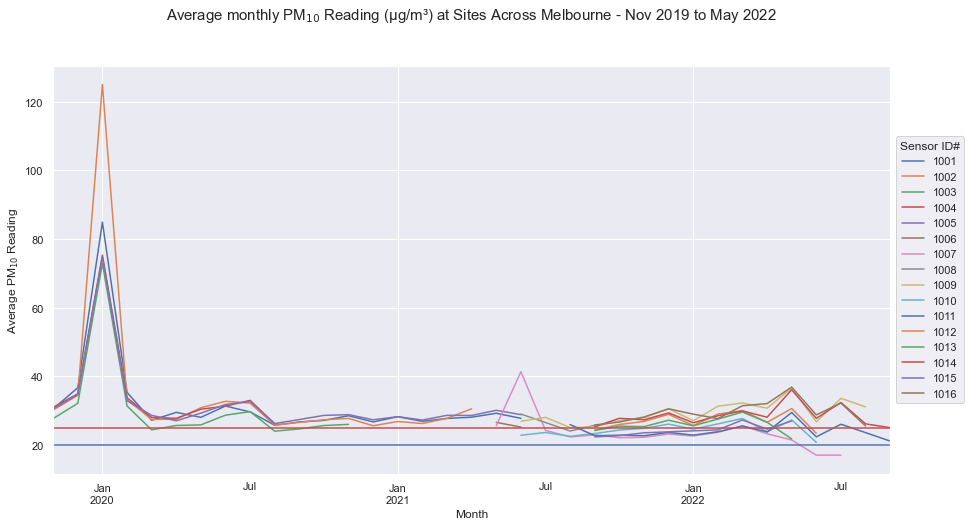

In [10]:
groupbyfields = ['site_id', pd.Grouper(key='local_time', freq='M')]
aggregatebyfields = {'value':['mean']}

# Create new DataFrame grouping the averages of each month since recording first began.
Pm10AllSiteCount = pd.DataFrame(all_pm10_dataset.groupby(groupbyfields).agg(aggregatebyfields))
Pm10AllSiteCount = Pm10AllSiteCount.reset_index()

# Plot this in a timeline graph
sns.set_theme()
fig, ax = plt.subplots(1,1);
Pm10AllSiteCount.groupby(['site_id']).plot(x='local_time', y='value', ax=ax, figsize=(15,7.5))
plt.legend([v[0] for v in Pm10AllSiteCount.groupby('site_id')['site_id']], loc='center left', bbox_to_anchor=(1, 0.5)).set_title('Sensor ID#')
plt.xlabel("Month")
plt.ylabel("Average PM$_{10}$ Reading")
plt.title("Average monthly PM$_{10}$ Reading (µg/m\u00b3) at Sites Across Melbourne - Nov 2019 to May 2022", y=1.1, fontsize=15)

# Add lines representing the national and victorian annual standards.
ax.axhline(y = 25, color = 'r', label='National Annual Standard')
ax.axhline(y = 20, color = 'b', label='Victorian Annual Standard')

**Interpreting the graph**

We can see all sites generally follow the same trend however based on current and past data there's no reason to expect any significant drops that would reach Victorias annual standard. Of the sites still currently recording data, sites 1009, 1012, 1016 & 1014 are showing the highest averages.

**Looking purely at the last year of data**

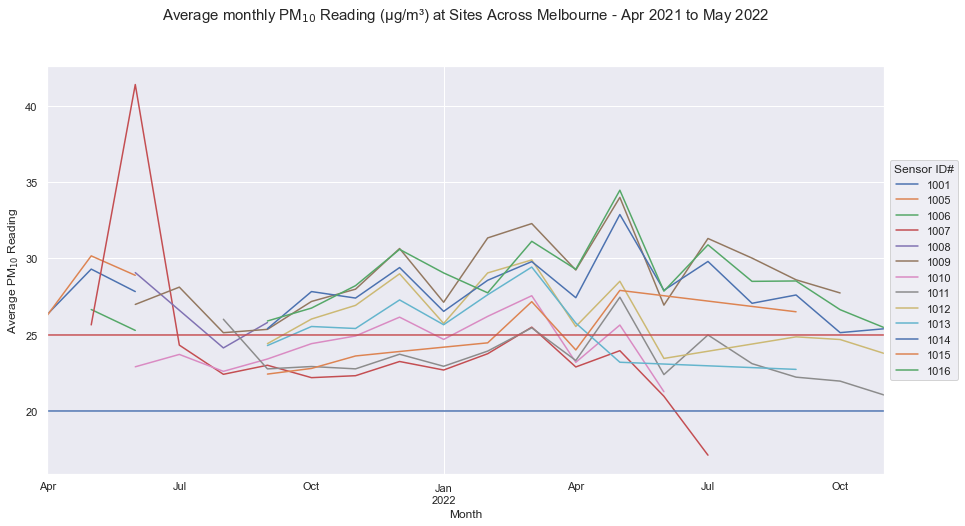

In [11]:
groupbyfields = ['site_id', pd.Grouper(key='local_time', freq='M')]
aggregatebyfields = {'value':['mean']}

# Create new DataFrame grouping the averages of each month over the last year.
Pm10AllSiteCount = pd.DataFrame(pm10_dataset.groupby(groupbyfields).agg(aggregatebyfields))
Pm10AllSiteCount = Pm10AllSiteCount.reset_index()

# Plot this in a timeline graph
fig, ax = plt.subplots(1,1);
Pm10AllSiteCount.groupby(['site_id']).plot(x='local_time', y='value', ax=ax, figsize=(15,7.5))
plt.legend([v[0] for v in Pm10AllSiteCount.groupby('site_id')['site_id']], loc='center left', bbox_to_anchor=(1, 0.5)).set_title('Sensor ID#')
plt.xlabel("Month")
plt.ylabel("Average PM$_{10}$ Reading")
plt.title("Average monthly PM$_{10}$ Reading (µg/m\u00b3) at Sites Across Melbourne - Apr 2021 to May 2022", y=1.1, fontsize=15)

# Add lines representing the national and victorian annual standards.
ax.axhline(y = 25, color = 'r', label='National Annual Standard')
ax.axhline(y = 20, color = 'b', label='Victorian Annual Standard')


**Mapping sensor data**

Let's now look at merging our data with the sensor location dataset so we can visualise the results.

Sensor location dataset: https://data.melbourne.vic.gov.au/Environment/Microclimate-Sensor-Locations/irqv-hjr4

In [ ]:
#Loading Melbourne Microclimate Sensor Location data

dataresource = client.get('irqv-hjr4')

# Retrieve data from Microclimate Sensor Locations dataset. 
location_dataset = pd.DataFrame.from_dict(dataresource)
location_dataset.info()


In [13]:
# Set site_id to int for merging
location_dataset[['site_id']] = location_dataset[['site_id']].astype(int)
location_dataset[['longitude', 'latitude']] = location_dataset[['longitude', 'latitude']].astype(float)

In [14]:
# Merging sensor location data with reading data.
pm10 = pd.merge(pm10SiteCount, location_dataset, on='site_id')

In [ ]:
# Drop unused columns and convert remaining to string datatypes.
pm10 = pm10.drop(['gateway_hub_id', 'end_reading', 'last_data', 'location'], axis=1)
pm10 = pm10.convert_dtypes()
pm10.info()

In [16]:
# Drop retired sensors, remaining sensors running since at least September 2021.
pm10 = pm10[pm10['site_status'] != 'R']
pm10

,site_id,value_count,value_mean,site_status,start_reading,longitude,latitude
3,1007,9277,24.204764,C,2021-05-20T00:00:00.000,144.951835,-37.82246
5,1009,11198,28.853242,C,2021-06-14T00:00:00.000,144.965705,-37.816868
6,1010,8028,24.644133,C,2021-06-29T00:00:00.000,144.952222,-37.8225
7,1011,10147,23.501153,C,2021-07-07T00:00:00.000,144.952222,-37.822222
8,1012,7406,26.658304,C,2021-09-17T00:00:00.000,144.97,-37.813333
9,1013,5360,26.349944,C,2021-09-17T00:00:00.000,144.956389,-37.811944
10,1014,9541,28.09564,C,2021-09-17T00:00:00.000,144.967222,-37.8175
11,1015,4344,24.608379,C,2021-09-17T00:00:00.000,144.9725,-37.810278
12,1016,5736,29.260722,C,2021-09-17T00:00:00.000,144.960556,-37.812778


<div class="usecase-section-header">Pedestrian data analysis</div>

**Relevant Dataset**

Pedestrian Counting System - Monthly (counts per hour). Retrieve all data recorded since the 11th of April 2021 to help identify high pedestrian traffic areas.

In [17]:
dataset_id = 'b2ak-trbp' # Pedestrian Counting Dataset
dataresource = client.get(dataset_id, where="Date_Time > '2021-04-11T20:00:00' LIMIT 7500000") # Select years worth of recording
pedest_count = pd.DataFrame.from_dict(dataresource)

In [ ]:
pedest_count.info()

In [ ]:
# Drop columns not being used
pedest_count = pedest_count.drop(['id', 'year', 'month', 'day', 'mdate', 'time'], axis=1)

# Convert to correct data types
pedest_count[[ 'sensor_id', 'hourly_counts']] = pedest_count[['sensor_id', 'hourly_counts']].astype(int)
pedest_count['date_time'] = pd.to_datetime(pedest_count['date_time'] )
pedest_count = pedest_count.convert_dtypes()

pedest_count.dtypes

**Calculating hourly averages**

With columns and datatypes sorted, lets focus on the average hourly pedestrian count for each sensor.

In [26]:
groupbyfields = ['sensor_id']
aggregatebyfields = ["mean"]

# Create new DataFrame with mean values for each site.
pedest_mean = pd.DataFrame(pedest_count.groupby(groupbyfields)['hourly_counts'].agg(aggregatebyfields).astype(int)
                           .add_prefix('hourly_counts_'))
pedest_mean = pedest_mean.reset_index()
pedest_mean

,sensor_id,hourly_counts_mean
0,1,679
1,2,432
2,3,697
3,4,817
4,5,714
...,...,...
71,79,411
72,84,892
73,85,78
74,86,56


**Pairing datasets**

Lets now obtain the paired dataset containing each sensors location.

In [21]:
dataset_id = 'h57g-5234' # Pedestrian Counting Sensor Locations Dataset
dataresource = client.get(dataset_id)
pedest_loc = pd.DataFrame.from_dict(dataresource)

In [ ]:
pedest_loc.info()

In [ ]:
# Drop columns not likely to be used
pedest_loc = pedest_loc.drop(['sensor_description', 'direction_1', 'direction_2', 'location', 'note'], axis=1)

# Convert to correct data types
pedest_loc[[ 'sensor_id']] = pedest_loc[['sensor_id']].astype(int)
pedest_loc[['latitude', 'longitude']] = pedest_loc[['latitude', 'longitude']].astype(float)
pedest_loc['installation_date'] = pd.to_datetime(pedest_loc['installation_date'])
pedest_loc = pedest_loc.convert_dtypes()

pedest_loc.dtypes

In [24]:
# Merging sensor location data with counting data.
pedest = pd.merge(pedest_mean, pedest_loc, on='sensor_id')

**Observations**

With our data merged, can see below that only one sensor (ID: 79) was installed during the period of data we're examining, we should take note of this as it could factor into its average. Otherwise we have a complete timeframe.

In [25]:
pedest

,sensor_id,hourly_counts_mean,sensor_name,installation_date,status,latitude,longitude
0,1,679,Bou292_T,2009-03-24,A,-37.813494,144.965153
1,2,432,Bou283_T,2009-03-30,A,-37.813807,144.965167
2,3,697,Swa295_T,2009-03-25,A,-37.811015,144.964295
3,4,817,Swa123_T,2009-03-23,A,-37.81488,144.966088
4,5,714,PriNW_T,2009-03-26,A,-37.818742,144.967877
...,...,...,...,...,...,...,...
71,79,411,FliSS_T,2021-09-10,A,-37.81794,144.966167
72,84,892,ElFi_T,2021-12-03,A,-37.81798,144.965034
73,85,78,488Mac_T,2021-12-21,A,-37.794324,144.929734
74,86,56,574Qub_T,2021-12-21,A,-37.8031,144.949081


<div class="usecase-section-header">Insect Analysis</div>

**Mapping Insect Density**

This analysis combines three MOP datasets to calculate the relationship between tree canopy and number of different insect species present at given locations. This relationship provides further justification of the green wall locations chosen, as the locations are chosen from areas around the city with low tree canopy coverage. 

First we load and format the relevant datasets:  

In [27]:
#Butterfly_biodiversity_survey_2017
bFlyDataResource = client.get('kmtd-nvqr',where="sloc >= 0 LIMIT 75000") #Note SoQL query is designed to retrieve all records.
bflydata = pd.DataFrame.from_dict(bFlyDataResource)


#Insect_Records_in_the_City_of_Melbourne__from_Little_Things_that_Run_the_City_
insectDataResource = client.get('47ai-9yup',where="Taxa = 'Insect' LIMIT 75000") #Note SoQL query is designed to retrieve all records.
insectdata = pd.DataFrame.from_dict(insectDataResource)

In [28]:
#Importing tree canopy data as geoJSON

from urllib.request import urlopen
import json

geoJSON_Id = 'tq3k-d7n7'

GeoJSONURL = 'https://'+domain+'/api/geospatial/'+geoJSON_Id+'?method=export&format=GeoJSON'

with urlopen(GeoJSONURL) as response:
    block = json.load(response)

canopies = gpd.GeoDataFrame.from_features(block["features"])
canopies.crs = "EPSG:4326" #Setting coordinate reference system (CRS) for the format of the data (WGS84)

In [189]:
#Viewing the butterfly dataset
bflydata

,site,sloc,walk,date,time,vegwalktime,vegspecies,vegfamily,lat,lon,...,tabe,brow,csem,aand,jvil,paur,ogyr,gmac,datetime,location
0,Womens Peace Gardens,2,1,2017-01-29T00:00:00.000,11:07,0.3069,Schinus molle,Anacardiaceae,-37.7913,144.9241,...,0,0,0,0,0,0,0,0,2017-01-29T11:07:00.000,"{'latitude': '-37.7913', 'longitude': '144.9241'}"
1,Womens Peace Gardens,2,1,2017-02-26T00:00:00.000,11:42,1.3128,Schinus molle,Anacardiaceae,-37.7912,144.9244,...,0,0,0,0,0,0,0,0,2017-02-26T11:42:00.000,"{'latitude': '-37.7912', 'longitude': '144.9244'}"
2,Murchinson Square,1,1,2017-01-26T00:00:00.000,10:10,0.2306,Asteraceae 1,Asteraceae,-37.8001,144.9729,...,0,0,0,0,0,0,0,0,2017-01-26T10:10:00.000,"{'latitude': '-37.8001', 'longitude': '144.9729'}"
3,Fitzroy-Treasury Gardens,3,1,2017-03-09T00:00:00.000,10:21,0.1818,Begonia sp.,Begoniaceae,-37.8143,144.9814,...,0,0,0,0,0,0,0,0,2017-03-09T10:21:00.000,"{'latitude': '-37.8143', 'longitude': '144.9814'}"
4,Westgate Park,4,3,2017-03-03T00:00:00.000,17:27,1.3333,Xerochrysum viscosum,Asteraceae,-37.8303,144.9102,...,0,0,0,0,0,0,0,0,2017-03-03T17:27:00.000,"{'latitude': '-37.8303', 'longitude': '144.9102'}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4055,Westgate Park,1,1,2017-02-05T00:00:00.000,09:39,1.0397,Bursaria spinosa,Pittosporaceae,-37.832,144.9061,...,0,0,0,0,0,0,0,0,2017-02-05T09:39:00.000,"{'latitude': '-37.832', 'longitude': '144.9061'}"
4056,Argyle Square,1,2,2017-02-11T00:00:00.000,11:01,0.0525,Salvia sp.,Lamiaceae,-37.8024,144.9663,...,0,0,0,0,0,0,0,0,2017-02-11T11:01:00.000,"{'latitude': '-37.8024', 'longitude': '144.9663'}"
4057,Westgate Park,4,1,2017-02-02T00:00:00.000,11:05,1.5948,Xerochrysum viscosum,Asteraceae,-37.8316,144.9093,...,0,0,0,0,0,0,0,0,2017-02-02T11:05:00.000,"{'latitude': '-37.8316', 'longitude': '144.9093'}"
4058,Argyle Square,1,2,2017-02-11T00:00:00.000,11:04,0.0639,Salvia sp.,Lamiaceae,-37.8023,144.9664,...,0,0,0,0,0,0,0,0,2017-02-11T11:04:00.000,"{'latitude': '-37.8023', 'longitude': '144.9664'}"


In [29]:
#Aggregating the butterfly data as count of individual species by monitoring location.
bflyCounts = bflydata.groupby(["site"])["site"].count().reset_index(name="Butterfly Species Count")
bflyCounts.insert(0, 'id', range(1, 1 + len(bflyCounts)))
bflyCounts

,id,site,Butterfly Species Count
0,1,Argyle Square,256
1,2,Canning/Neill St Reserve,40
2,3,Carlton Gardens South,592
3,4,Fitzroy-Treasury Gardens,572
4,5,Gardiner Reserve,28
5,6,Garrard Street Reserve,48
6,7,Lincoln Square,124
7,8,Murchinson Square,52
8,9,Pleasance Gardens,56
9,10,Princes Park,224


In [30]:
#Viewing the insect dataset
insectdata

,taxa,kingdom,phylum,class,order,family,genus,species,identification_notes,common_name
0,Insect,ANIMALIA,ARTHROPODA,INSECTA,HEMIPTERA,TRIOZIDAE,Aacanthocnema,dobsoni,Royal Park,NaN
1,Insect,ANIMALIA,ARTHROPODA,INSECTA,HEMIPTERA,TRIOZIDAE,Aacanthocnema,dobsoni,Royal Park,NaN
2,Insect,ANIMALIA,ARTHROPODA,INSECTA,HEMIPTERA,TRIOZIDAE,Aacanthocnema,dobsoni,Royal Park,NaN
3,Insect,ANIMALIA,ARTHROPODA,INSECTA,HEMIPTERA,TRIOZIDAE,Aacanthocnema,dobsoni,Westgate Park,NaN
4,Insect,ANIMALIA,ARTHROPODA,INSECTA,COLEOPTERA,CURCULIONIDAE,Acalonoma,NaN,Royal Park,Acalonoma sp. 1 (pusillum group)
...,...,...,...,...,...,...,...,...,...,...
3690,Insect,ANIMALIA,ARTHROPODA,INSECTA,HYMENOPTERA,TIPHIIDAE,NaN,NaN,Royal Park,Tiphiidae 2
3691,Insect,ANIMALIA,ARTHROPODA,INSECTA,HYMENOPTERA,TIPHIIDAE,NaN,NaN,Royal Park,Tiphiidae 2
3692,Insect,ANIMALIA,ARTHROPODA,INSECTA,HYMENOPTERA,TORYMIDAE,NaN,NaN,Canning/Neil Street Reserve,Torymidae 1
3693,Insect,ANIMALIA,ARTHROPODA,INSECTA,HYMENOPTERA,TORYMIDAE,NaN,NaN,Garrard Street Reserve,Torymidae 1


In [31]:
#Aggregating the insect data as count of individual species by monitoring location.
insectCounts = insectdata.groupby(["identification_notes"])["identification_notes"].count().reset_index(name="Miscellaneous Insect Count")

#Creating id index
insectCounts.insert(0, 'id', range(1, 1 + len(insectCounts)))

#Renaming the monitoring location column to something more intuitive.
insectCounts = insectCounts.rename({'identification_notes': 'Location'}, axis=1) 

insectCounts

,id,Location,Miscellaneous Insect Count
0,1,Argyle Square,105
1,2,Canning/Neil Street Reserve,15
2,3,Carlton Gardens South,273
3,4,Fitzroy-Treasury Gardens,557
4,5,Gardiner Reserve,51
5,6,Garrard Street Reserve,33
6,7,Lincoln Square,79
7,8,Murchinson Square,22
8,9,Pleasance Gardens,76
9,10,Princes Park,446


**Creating shapefile to match monitoring locations**

The insect and butterfly data only has the names of the monitoring locations listed for its geographical data. We will create a shapefile with coordinates taken from an online map. Including the correct coordinates reference system (CRS) is essential for the points to be in the right place. 

In [32]:
#Creating point data shapefile to align with the monitoring locations. Coordinates taken from external mapping software (QGIS).

insectCoords = pd.DataFrame({'longitude': [2496990.9139893204, 2497716.4106032336, 2497468.0019974816,2497904.2864259947,2495048.0358508285,2494903.373709257,2496730.7911691167,2497631.1602672394,2495215.229639408,2496593.58352767,
                                 2495657.343150738,2496862.1697277585,2496501.887571214,2491904.086409784,2493312.0341030643], 
                   
                   'latitude': [2410917.9145240453, 2411981.946331717, 2410514.362637444,2409637.309870564,2411319.224455721,2413521.833072339,2410956.1398554766,2411196.477423501,2411624.2424233076,2412883.3243095265,
                                2412807.994624026,2410110.0260665533,2411092.4507149556,2407712.4794691135,2412201.7700121445]})

insectCounts['geometry'] = gpd.points_from_xy(insectCoords.longitude, insectCoords.latitude, crs="EPSG:3111")

insectCounts

,id,Location,Miscellaneous Insect Count,geometry
0,1,Argyle Square,105,POINT (2496990.914 2410917.915)
1,2,Canning/Neil Street Reserve,15,POINT (2497716.411 2411981.946)
2,3,Carlton Gardens South,273,POINT (2497468.002 2410514.363)
3,4,Fitzroy-Treasury Gardens,557,POINT (2497904.286 2409637.310)
4,5,Gardiner Reserve,51,POINT (2495048.036 2411319.224)
5,6,Garrard Street Reserve,33,POINT (2494903.374 2413521.833)
6,7,Lincoln Square,79,POINT (2496730.791 2410956.140)
7,8,Murchinson Square,22,POINT (2497631.160 2411196.477)
8,9,Pleasance Gardens,76,POINT (2495215.230 2411624.242)
9,10,Princes Park,446,POINT (2496593.584 2412883.324)


**Creating final dataset**

Now we will combine the three datasets to determine the amount of insects counted at each location in relation to the area of canopy cover found within 50, 100 and 200m of the monitoring locations.

In [33]:
#Adding butterfly data to insect data.
insectCounts = pd.merge(left=insectCounts, right=bflyCounts, how='left', left_on='id', right_on='id')
insectCounts = insectCounts.drop(['site'], axis=1)

#Summing counts of misc. insects and butterflies.
insectCounts['Total Insect Count'] = insectCounts["Miscellaneous Insect Count"] + insectCounts["Butterfly Species Count"]

#Converting dataframe to geopandas format.
insectCounts = gpd.GeoDataFrame(insectCounts, geometry='geometry')

insectCounts

,id,Location,Miscellaneous Insect Count,geometry,Butterfly Species Count,Total Insect Count
0,1,Argyle Square,105,POINT (2496990.914 2410917.915),256,361
1,2,Canning/Neil Street Reserve,15,POINT (2497716.411 2411981.946),40,55
2,3,Carlton Gardens South,273,POINT (2497468.002 2410514.363),592,865
3,4,Fitzroy-Treasury Gardens,557,POINT (2497904.286 2409637.310),572,1129
4,5,Gardiner Reserve,51,POINT (2495048.036 2411319.224),28,79
5,6,Garrard Street Reserve,33,POINT (2494903.374 2413521.833),48,81
6,7,Lincoln Square,79,POINT (2496730.791 2410956.140),124,203
7,8,Murchinson Square,22,POINT (2497631.160 2411196.477),52,74
8,9,Pleasance Gardens,76,POINT (2495215.230 2411624.242),56,132
9,10,Princes Park,446,POINT (2496593.584 2412883.324),224,670


In [34]:
#Creating circles (buffers) of 50m and 100m radius around the insect monitoring locations. These will be combined with the tree canopy data to determine relationship between canopy and insect variety.

insectBuffer50 = insectCounts.buffer(50)
insectBuffer100 = insectCounts.buffer(100)
insectBuffer200 = insectCounts.buffer(200)

insectBuffer50 = gpd.GeoDataFrame(geometry=gpd.GeoSeries(insectBuffer50))
insectBuffer100 = gpd.GeoDataFrame(geometry=gpd.GeoSeries(insectBuffer100))
insectBuffer200 = gpd.GeoDataFrame(geometry=gpd.GeoSeries(insectBuffer200))

insectBuffer50.insert(0, 'id', range(1, 1 + len(insectBuffer50)))
insectBuffer100.insert(0, 'id', range(1, 1 + len(insectBuffer100)))
insectBuffer200.insert(0, 'id', range(1, 1 + len(insectBuffer200)))

#Creating areas of canopy around insect monitoring locations. Note may need to install rtree to enable the overlay operation.
insectCanopies50 = canopies.to_crs(3577).overlay(insectBuffer50.to_crs(3577), how='intersection')
insectCanopies100 = canopies.to_crs(3577).overlay(insectBuffer100.to_crs(3577), how='intersection')
insectCanopies200 = canopies.to_crs(3577).overlay(insectBuffer200.to_crs(3577), how='intersection')

print(insectCanopies50)


       id_1  id_2                                           geometry
0    104130    14  POLYGON ((1141445.921 -4193561.841, 1141445.81...
1    104087    14  POLYGON ((1141435.440 -4193555.411, 1141435.30...
2    104138    14  MULTIPOLYGON (((1141446.420 -4193561.903, 1141...
3    104322    14  POLYGON ((1141410.039 -4193573.172, 1141409.04...
4    104304    14  POLYGON ((1141414.436 -4193572.464, 1141414.32...
..      ...   ...                                                ...
491   73820     4  POLYGON ((1147641.605 -4192318.251, 1147641.71...
492   73796     4  POLYGON ((1147641.946 -4192317.542, 1147641.83...
493   73641     4  POLYGON ((1147614.722 -4192308.169, 1147614.22...
494   73615     4  POLYGON ((1147614.096 -4192307.090, 1147613.84...
495   74827     4  POLYGON ((1147587.219 -4192352.090, 1147587.32...

[496 rows x 3 columns]


In [35]:
#Calculating the area of canopy cover and adding it as a variable.

insectCanopies50['area'] = insectCanopies50['geometry'].area
insectCanopies100['area'] = insectCanopies100['geometry'].area
insectCanopies200['area'] = insectCanopies200['geometry'].area

In [36]:
#Summing canopy area by insect study location.
insectCanopies50 = insectCanopies50.groupby(["id_2"], as_index=False)["area"].sum()
insectCanopies100 = insectCanopies100.groupby(["id_2"], as_index=False)["area"].sum()
insectCanopies200 = insectCanopies200.groupby(["id_2"], as_index=False)["area"].sum()

In [37]:
insectCanopies50 = insectCanopies50.rename({'id_2': 'id',"area": "Canopy_Area_within_50m"}, axis=1)
insectCanopies100 = insectCanopies100.rename({'id_2': 'id',"area": "Canopy_Area_within_100m"}, axis=1)
insectCanopies200 = insectCanopies200.rename({'id_2': 'id',"area": "Canopy_Area_within_200m"}, axis=1)

In [38]:
#Adding the calculated areas to the insect dataset.

insectCounts = pd.merge(left=insectCounts, right=insectCanopies50, how='left', left_on='id', right_on='id')
insectCounts = pd.merge(left=insectCounts, right=insectCanopies100, how='left', left_on='id', right_on='id')
insectCounts = pd.merge(left=insectCounts, right=insectCanopies200, how='left', left_on='id', right_on='id')

In [39]:
#Viewing the final insect dataset.
insectCounts

,id,Location,Miscellaneous Insect Count,geometry,Butterfly Species Count,Total Insect Count,Canopy_Area_within_50m,Canopy_Area_within_100m,Canopy_Area_within_200m
0,1,Argyle Square,105,POINT (2496990.914 2410917.915),256,361,4337.761239,11708.661318,19431.520072
1,2,Canning/Neil Street Reserve,15,POINT (2497716.411 2411981.946),40,55,1718.869834,3274.540483,8310.062987
2,3,Carlton Gardens South,273,POINT (2497468.002 2410514.363),592,865,6593.746242,18617.315930,46600.421530
3,4,Fitzroy-Treasury Gardens,557,POINT (2497904.286 2409637.310),572,1129,5041.864217,16344.909060,49381.679929
4,5,Gardiner Reserve,51,POINT (2495048.036 2411319.224),28,79,4387.109784,12071.034682,30428.417613
5,6,Garrard Street Reserve,33,POINT (2494903.374 2413521.833),48,81,1638.678259,4009.880939,16333.862172
6,7,Lincoln Square,79,POINT (2496730.791 2410956.140),124,203,3196.918871,7475.327496,12903.552974
7,8,Murchinson Square,22,POINT (2497631.160 2411196.477),52,74,1858.354637,3426.253100,26320.635387
8,9,Pleasance Gardens,76,POINT (2495215.230 2411624.242),56,132,2812.159284,7391.812237,25713.525523
9,10,Princes Park,446,POINT (2496593.584 2412883.324),224,670,2470.257730,5664.470683,25053.417166


**Graphing the data**

Now that we've combined our insect and tree canopy datasets, we can compare the results to view the relationship between number of insect species and tree canopy coverage.

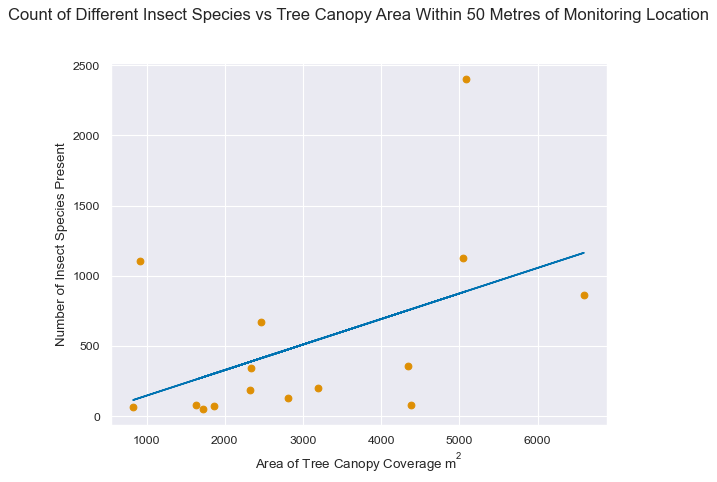

50m Pearsons correlation = 0.47805394899273107



In [61]:
from scipy.stats import pearsonr
from matplotlib.pyplot import figure

m, b = np.polyfit(insectCounts['Canopy_Area_within_50m'], insectCounts['Total Insect Count'], 1) #Line of best fit.
corr, _= pearsonr(insectCounts['Canopy_Area_within_50m'],insectCounts['Total Insect Count'])

figure(figsize=(8, 6), dpi=80)
plt.plot(insectCounts['Canopy_Area_within_50m'], insectCounts['Total Insect Count'], 'o', c='#de8f05')
plt.plot(insectCounts['Canopy_Area_within_50m'], m*insectCounts['Canopy_Area_within_50m']+ b, c='#0173b2')
plt.title("Count of Different Insect Species vs Tree Canopy Area Within 50 Metres of Monitoring Location", y=1.1, fontsize=15)
plt.xlabel("Area of Tree Canopy Coverage $\mathregular{m^{2}}$")
plt.ylabel("Number of Insect Species Present")
print()
plt.show()
print("50m Pearsons correlation =", corr)
print()


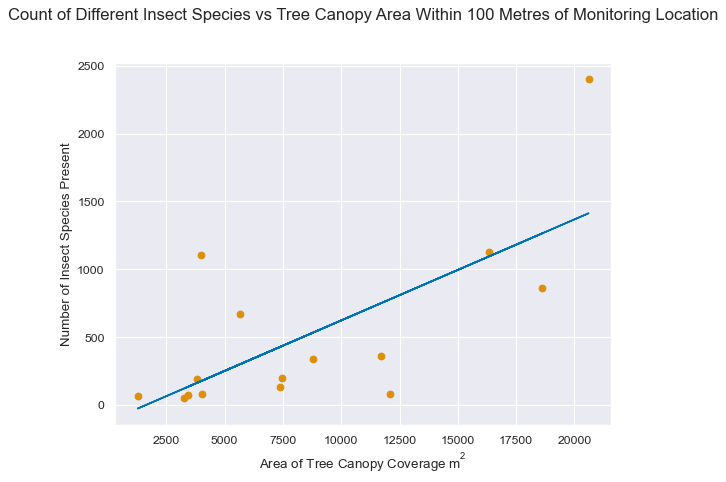

100m Pearsons correlation = 0.6973749996557819



In [62]:
m, b = np.polyfit(insectCounts['Canopy_Area_within_100m'], insectCounts['Total Insect Count'], 1) #Line of best fit.
corr, _= pearsonr(insectCounts['Canopy_Area_within_100m'],insectCounts['Total Insect Count'])

figure(figsize=(8, 6), dpi=80)
plt.plot(insectCounts['Canopy_Area_within_100m'], insectCounts['Total Insect Count'], 'o', c='#de8f05')
plt.plot(insectCounts['Canopy_Area_within_100m'], m*insectCounts['Canopy_Area_within_100m']+ b, color='#0173b2')
plt.title("Count of Different Insect Species vs Tree Canopy Area Within 100 Metres of Monitoring Location", y=1.1, fontsize=15)
plt.xlabel("Area of Tree Canopy Coverage $\mathregular{m^{2}}$")
plt.ylabel("Number of Insect Species Present")
print()
plt.show()
print("100m Pearsons correlation =", corr)
print()


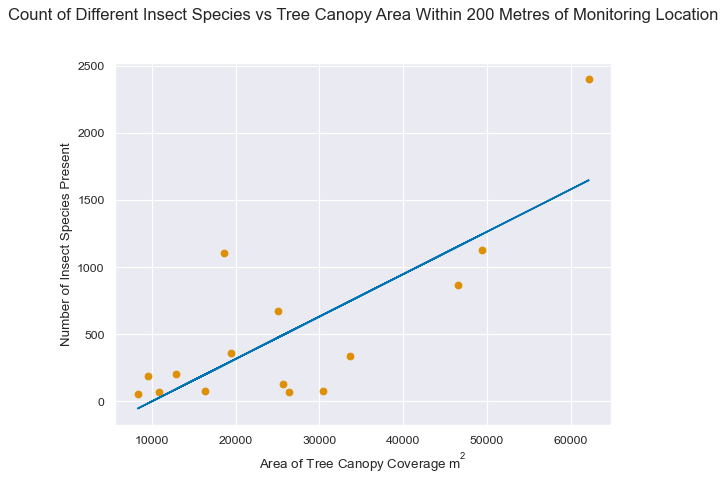

200m Pearsons correlation = 0.7777414249082173



In [63]:
m, b = np.polyfit(insectCounts['Canopy_Area_within_200m'], insectCounts['Total Insect Count'], 1) #Line of best fit.
corr, _= pearsonr(insectCounts['Canopy_Area_within_200m'],insectCounts['Total Insect Count'])

figure(figsize=(8, 6), dpi=80)
plt.plot(insectCounts['Canopy_Area_within_200m'], insectCounts['Total Insect Count'], 'o', c='#de8f05')
plt.plot(insectCounts['Canopy_Area_within_200m'], m*insectCounts['Canopy_Area_within_200m']+ b, color='#0173b2')
plt.title("Count of Different Insect Species vs Tree Canopy Area Within 200 Metres of Monitoring Location", y=1.1, fontsize=15)
plt.xlabel("Area of Tree Canopy Coverage $\mathregular{m^{2}}$")
plt.ylabel("Number of Insect Species Present")
print()
plt.show()
print("200m Pearsons correlation =", corr)
print()


**Results**

We can see from the graphs that as we expected, there is a strong relationship between tree canopy coverage and number of insect species present at a location. 
In our analysis, the relationship becomes stronger when a wider area is considered for canopy coverage. The correlation between count of insect species and canopy coverage ranged from 0.47 
when considering canopy up to 50m from the monitoring site to 0.77 when considering up to 200m. 

0.77 indicates a strong linear relationship. 

0.47 still indicates a relationship, but the results are not as decisive. 

Intuitively it makes sense to consider the wider area, as many flying insects would have a range of at least 200m. Some travel thousands of kilometres! 


These results reinforce the need for green walls at locations with little canopy coverage.

<div class="usecase-section-header">Mapping the results</div>

**Tree Canopy Area**

First we'll prepare the canopy data for the map, to highlight the areas with less vegetation. The canopy data currently covers an area much bigger than what we're interested in, which is the CBD. We'll create a polygon and trim the data to the CBD. 

In [ ]:
#Creating CBD polygon.
from shapely.geometry import Polygon

lon_point_list = [144.944077, 144.970996, 144.975450, 144.948066]
lat_point_list = [-37.813788,-37.807214,-37.815545,-37.822770]

cbd_geom = Polygon(zip(lon_point_list, lat_point_list))
crs = {'init': 'epsg:4326'}
cbdBoundary = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[cbd_geom])   

cbdBoundary = cbdBoundary.to_crs(epsg=4326)

#Clipping canopy data to only the Melbourne CBD.
cbdCanopy = canopies.to_crs(4326).overlay(cbdBoundary, how='intersection')

**Pedestrian Traffic**

Here we visualise the hourly average for pedestrian traffic via scaled blue circles. Large circles indicate busier locations.

In [77]:
# Sections before and after where lat/long is added in order to open 
# a new tab containing the google street view of the location. 
linkPart1 = "<br><a href=https://www.google.com/maps/@?api=1&map_action=pano&viewpoint="
linkPart2 = "&source=outdoor\" target=\"_blank\">Street&nbspView</a>"

# Colour map based on PM10 values.
colormap = cm.LinearColormap(colors=['green','yellow','red'], index=[20, 25, 30], vmin=20, vmax=30,
                             caption='Average PM10 Sensor readings')

# Create (f)igure and base (m)ap with style and zoom level.
f = folium.Figure(width=1200, height=700)
m = folium.Map(location=[-37.81368709240999, 144.95738102347036], tiles = 'CartoDB positron', zoom_start=15,  width=1200, height=700)

# Feature Group for pedestrian count layer.
pc = folium.FeatureGroup(name="Pedestrian Count")

# Add sensor locations, popup information (ID, Avg ped count, Street View) and increase size with value.
for _, locat in pedest.iterrows():
    pc.add_child(
        folium.CircleMarker(
            color="#14a38e",
            location = [locat['latitude'], locat['longitude']],
            popup = ("ID:&nbsp;" + str(locat['sensor_id']) + "<br>People:&nbsp;" + str(locat['hourly_counts_mean']) + 
                     linkPart1 + str(locat['latitude']) + "," + str(locat['longitude']) + linkPart2),
            radius = locat['hourly_counts_mean'] / 25,
            fill = True
        )
    )

**PM10 Readings**

The following code visualises the paired 24 hour averaged sensor data we obtained above. Circle colour (green to red) is representative of the sensors reading average.

*NOTE:* 

You may need adjust your location in the street view tab by clicking the nearest street in the bottom left-hand map to avoid viewing user-generated google maps images.

In [80]:
# Feature Group for Particulate Matter 10 layer.
pm = folium.FeatureGroup(name="Particulate Matter 10")

# Add sensor locations, popup information (ID, PM10 value, Street View) and colour based on their mean value to Feature Group.
for _, locat in pm10.iterrows():
    pm.add_child(
        folium.CircleMarker(
            location = [locat['latitude'], locat['longitude']],
            popup = ("ID:&nbsp;" + str(locat['site_id']) + "<br>Average&nbspPM10&nbspConcentration:&nbsp;" + str(round(locat['value_mean'], 2)) + 
                     linkPart1 + str(locat['latitude']) + "," + str(locat['longitude']) + linkPart2),
            color = colormap(locat['value_mean']),
            fill = True,
            fill_opacity = 0.4
        )
    )  

#Adding the canopy data.
folium.Choropleth(cbdCanopy, fill_color='#0f9295', fill_opacity=0.8)
    
# Add mean pedestrian count feature group to map.
m.add_child(pc)

# Add particulate matter 10 feature group to map.
m.add_child(pm)

# Add Legend for PM colour levels.
colormap.add_to(m)


# Add layer control to map.
m.add_child(folium.LayerControl())

#Add map to figure
m.add_to(f)

f

<div class="usecase-section-header">Identified ideal green wall locations</div>

The above analysis and visualisations allow us to identify ideal green wall locations around the city of Melbourne. 

This analysis is by no means exhaustive, and there are many other aspects to consider. 
Once a potential area was identified using the map above, Google Street view was used to confirm an area's suitability.

The main driving factor in identifying locations was the absence of tree canopy. Nearby high levels of particulate matter confirmed a location as ideal. 
Areas with both high and low levels of pedestrian traffic could be seen as ideal, as:

1. Green walls increase the visual amenity of an area, increasing the number of people using certain routes.
2. Installing green walls in areas with already high levels of traffic ensure many people are able to enjoy them.

Some preliminary results are seen below:

**Location 1**

Corner of Flinders St & Elizabeth St, nearby to two of our highest PM levels (28.08, 28.43) and a well foot trafficked area (687) with area for large green wall. [View](https://goo.gl/maps/a2e2zJFYzybi9PDU7)

**Location 2**

Corner of Lonsdale St & Elizabeth St, near to another high PM level (28.83), though with varying degrees of foot traffic in its surrounding areas (171, 178, 511), it presents another good opportunity for a smaller green wall. [View](https://goo.gl/maps/zxXnWR1r2VaRzG5t9)

**Location 3**

Drewery Ln off Lonsdale St offers a variety of sections for green walls & vertical gardens whilst being nearby to some high traffic areas (556, 411, 549) and within 2 blocks of a high PM level reading (28.83). [View](https://goo.gl/maps/1Er5qoaDxuZXrVtx5)

**Location 4**

Sugden place off of Little Collins Street. There is very little vegetation in this part of the city and there is a large span of bare wall at this location. Installing a green wall here would provide wildlife with a valuable refuge. [View](https://goo.gl/maps/gB7HjgqfTCupdjXQA)

**Location 5**

Goldie Pl off Lonsdale St presents a large unused wall space that could serve as a large greenwall, located only streets away from a high PM level (28.83). [View](https://goo.gl/maps/wpC8dLiCva5krZw96)

**Location 6**

Another location on Little Collins Street. The unvegetated nature of the street would be greatly improved with multiple green walls, increasing visual amenity and attracting foot traffic. The sensor to the east has a mean PM10 reading of 27.5. [View](https://goo.gl/maps/dE4ARXeGvmkXtR6c7)

**Location 7**

This location is on the corner of Little Collins and Collins Way. The walls and roof of this Woolworths Metro could support a wealth of plants, further revitalising the street. A pedestrian sensor around the corner records low levels of foot traffic. This could be improved with greater visual amenity in the area. [View](https://goo.gl/maps/XHkU7A1SXHNqGxjFA)

<div class="usecase-section-header">Mapping the identified green wall locations</div>

Now that we've identified seven ideal locations, let's plot them on a map and see what they look like in Google Street View.

In [82]:
# Adding the potential locations latitude, longitude and street view link to specific wall/area so we can add them to the map

locations = [[-37.8180118, 144.964813, "https://goo.gl/maps/a2e2zJFYzybi9PDU7"], 
             [-37.8121325, 144.9625511, "https://goo.gl/maps/zxXnWR1r2VaRzG5t9"], 
             [-37.8116269, 144.9642739, "https://goo.gl/maps/1Er5qoaDxuZXrVtx5"], 
             [-37.8147010, 144.9652391, "https://goo.gl/maps/gB7HjgqfTCupdjXQA"],  
             [-37.8129905, 144.9604249, "https://goo.gl/maps/wpC8dLiCva5krZw96"],
             [-37.8138221, 144.9684325, "https://goo.gl/maps/dE4ARXeGvmkXtR6c7"],
             [-37.8155859, 144.9622939, "https://goo.gl/maps/XHkU7A1SXHNqGxjFA"]
             
            ]

# Create another base map with style and zoom level.
f2 = folium.Figure(width=1000, height=600)
m2 = folium.Map(location=[-37.81368709240999, 144.95738102347036], tiles = 'CartoDB positron', zoom_start=15,width=1000, height=600)

# Feature Group for potential locations layer.
pl = folium.FeatureGroup(name="Potential Locations")

# Add potential locations and popup information (Location Number, Street View facing proposed area) to Feature Group.
for idx, locat in enumerate(locations):
    pl.add_child(
        folium.Marker(
            location = [locat[0], locat[1]],
            popup = ("Ideal&nbspGreen&nbspWall&nbspLocation&nbsp;" + str(idx + 1) + "<br><a href=" + locat[2] + " target=\"_blank\">Street&nbspView</a>"),
            icon = folium.Icon(color = 'lightgreen', prefix='fa', icon="fa-leaf")
        )
    )
# Add potential locations feature group to map.
m2.add_child(pl)

# Add layer control to map.
m2.add_child(folium.LayerControl())

#Add map to figure
m2.add_to(f2)

f2

We hope you've enjoyed this use case, and are inspired to use it to explore greening option for the city!